In [1]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
import os

# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML
%matplotlib inline

# Camera Calibration
First of all we have to calibrate the camera. Therefore it is recommended to use at least 20 pictures to gather data to have a meaningful calibration. Calibration process follows the steps:
- generate object points (real world corner positions)
- read in image and convert it to grayscale
- find chessboard corners
- add corners to image points
- collect all image and object points for the 20 images
- determine calibration parameters via cv2.calibrateCamera

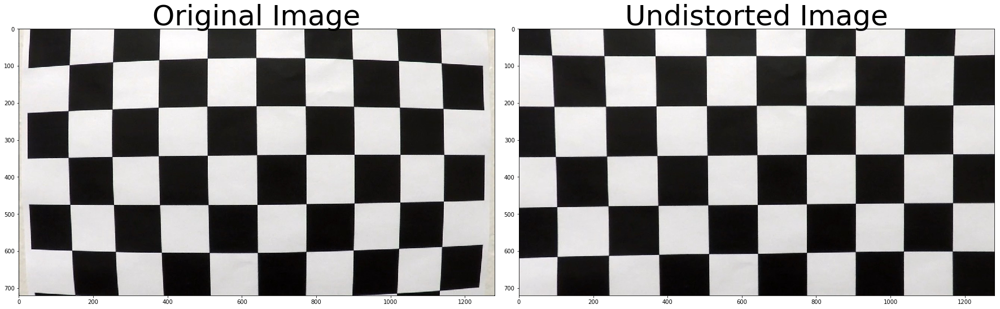

In [42]:
# iter through images
images = os.listdir("camera_cal/")

# initialize arrays
objpoints = []
imgpoints = []

# chessboard dimensions
nx = 9;
ny = 6;

# calculate objectpoints (will be the same for all images)
objp = np.zeros((nx*ny,3),np.float32)
objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2)

for image_name in images:
    # read image
    img = mpimg.imread("camera_cal/" + image_name)
    
    # convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # find chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
    
    if ret == True:
        imgpoints.append(corners)
        objpoints.append(objp)
        
        # Draw and display the corners (quick check for correctness of corner points)
        cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
        #plt.imshow(img)
        #plt.show()

# Finally calculate calibration parameters with all points summarized over the calibration pictures
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)

# test undistort
test_img = mpimg.imread("camera_cal/calibration1.jpg")
dst = cv2.undistort(test_img, mtx, dist, None, mtx)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(test_img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

f.savefig("output_images/camera_calibration.jpg")


# Find different methods to extract lane  lines
There are many different ways to extract lines out of a image. In this chapter I want to test different methods to find the most promisingly ones.

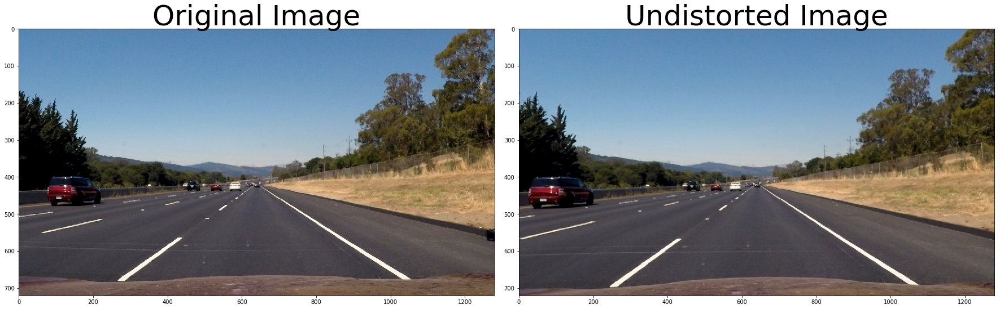

In [48]:
# load the test images
original_image = mpimg.imread("test_images/straight_lines2.jpg")

# undistort the image
img = cv2.undistort(original_image, mtx, dist, None, mtx)

# show difference
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(original_image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(img)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
#f.savefig("output_images/undistorted_test_image.jpg")


# Color channels


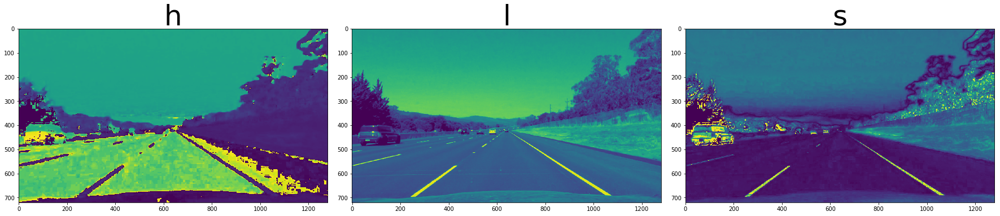

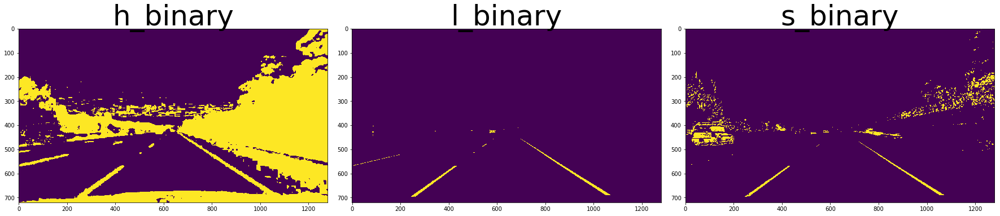

In [50]:
# Inspect HLS color space
hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
h = hls[:,:,0]
l = hls[:,:,1]
s = hls[:,:,2]

def color_channel_binary(img, threshold, color_space, channel):
    space = cv2.cvtColor(img, color_space)
    filtered_channel = space[:,:,channel]
    
    # generate threshholds
    binary = np.zeros_like(filtered_channel)
    binary[(filtered_channel > threshold[0]) & (filtered_channel <= threshold[1])] = 1
    return binary

# HLS color channel
h_binary = color_channel_binary(img, [0, 100], cv2.COLOR_RGB2HLS, 0)
l_binary = color_channel_binary(img, [220,255], cv2.COLOR_RGB2HLS, 1)
s_binary = color_channel_binary(img, [140,255], cv2.COLOR_RGB2HLS, 2)

# show difference
hls, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
hls.tight_layout()
ax1.imshow(h)
ax1.set_title('h', fontsize=50)
ax2.imshow(l)
ax2.set_title('l', fontsize=50)
ax3.imshow(s)
ax3.set_title('s', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# show difference
hls_binary, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
hls_binary.tight_layout()
ax1.imshow(h_binary)
ax1.set_title('h_binary', fontsize=50)
ax2.imshow(l_binary)
ax2.set_title('l_binary', fontsize=50)
ax3.imshow(s_binary)
ax3.set_title('s_binary', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

#hls.savefig("output_images/hls_original.jpg")
#hls_binary.savefig("output_images/hls_binary.jpg")

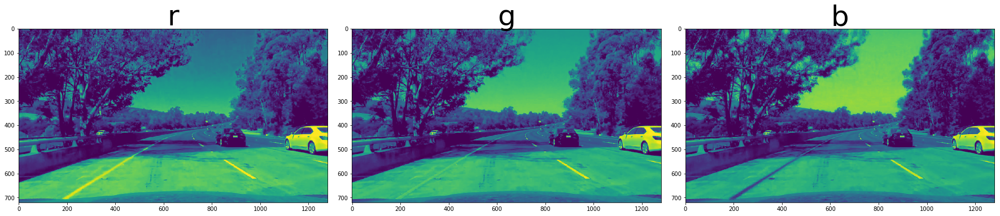

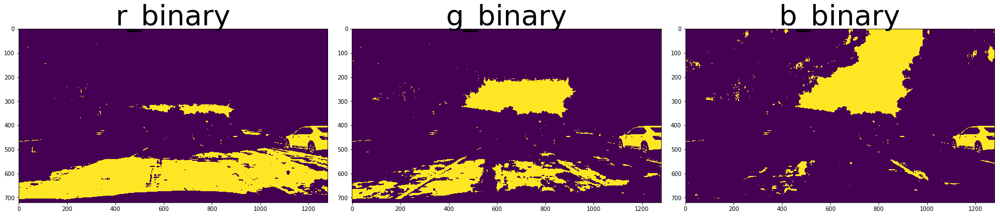

In [45]:
# Inspect RGB color space
r = img[:,:,0]
g = img[:,:,1]
b = img[:,:,2]

def rgb_channel_binary(img, threshold, channel):
    # generate threshholds
    binary = np.zeros_like(channel)
    binary[(channel > threshold[0]) & (channel <= threshold[1])] = 1
    return binary

# HLS color channel
r_binary = rgb_channel_binary(img, [170,255], r)
g_binary = rgb_channel_binary(img, [170,255], g)
b_binary = rgb_channel_binary(img, [170,255], b)

# show difference
rgb, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
rgb.tight_layout()
ax1.imshow(r)
ax1.set_title('r', fontsize=50)
ax2.imshow(g)
ax2.set_title('g', fontsize=50)
ax3.imshow(b)
ax3.set_title('b', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# show difference
rgb_binary, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
rgb_binary.tight_layout()
ax1.imshow(r_binary)
ax1.set_title('r_binary', fontsize=50)
ax2.imshow(g_binary)
ax2.set_title('g_binary', fontsize=50)
ax3.imshow(b_binary)
ax3.set_title('b_binary', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

rgb.savefig("output_images/rgb_original.jpg")
rgb_binary.savefig("output_images/rgb_binary.jpg")

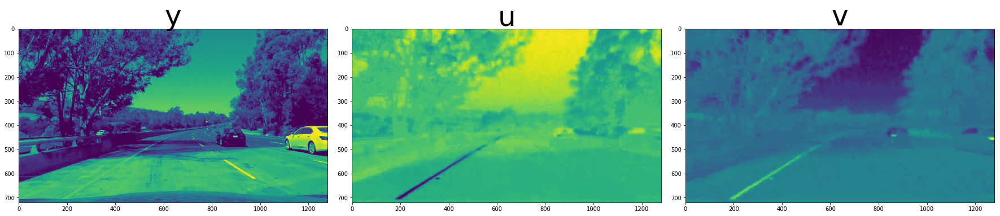

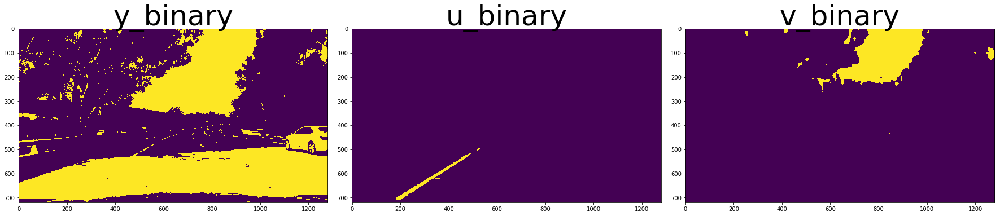

In [46]:
# Inspect yuv color space
yuv = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
y = yuv[:,:,0]
u = yuv[:,:,1]
v = yuv[:,:,2]
# yuv color channel
y_binary = color_channel_binary(img, [120,255], cv2.COLOR_RGB2YUV, 0)
u_binary = color_channel_binary(img, [0,100], cv2.COLOR_RGB2YUV, 1)
v_binary = color_channel_binary(img, [0,100], cv2.COLOR_RGB2YUV, 2)

# show difference
yuv, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
yuv.tight_layout()
ax1.imshow(y)
ax1.set_title('y', fontsize=50)
ax2.imshow(u)
ax2.set_title('u', fontsize=50)
ax3.imshow(v)
ax3.set_title('v', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# show difference
yuv_binary, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
yuv_binary.tight_layout()
ax1.imshow(y_binary)
ax1.set_title('y_binary', fontsize=50)
ax2.imshow(u_binary)
ax2.set_title('u_binary', fontsize=50)
ax3.imshow(v_binary)
ax3.set_title('v_binary', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

yuv.savefig("output_images/yuv_original.jpg")
yuv_binary.savefig("output_images/yuv_binary.jpg")

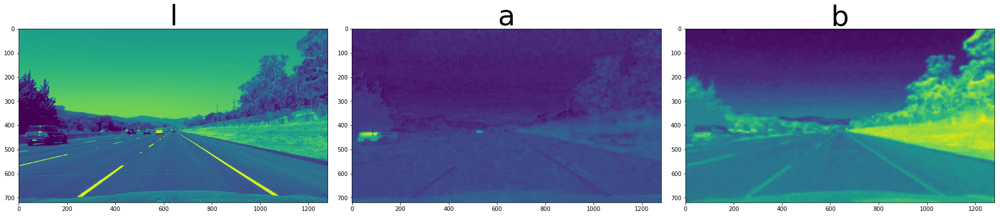

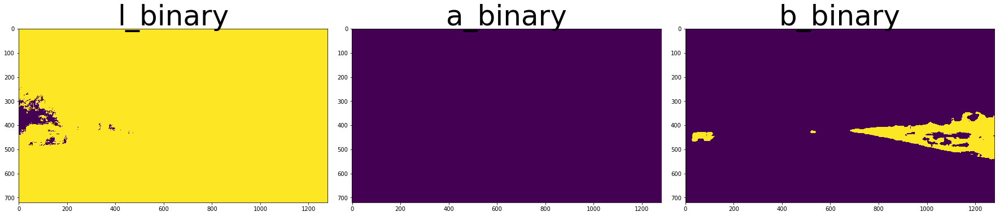

In [49]:
# Inspect LAB color space
yuv = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
l = yuv[:,:,0]
a = yuv[:,:,1]
b = yuv[:,:,2]
# yuv color channel
l_binary = color_channel_binary(img, [0,255], cv2.COLOR_RGB2YUV, 0)
a_binary = color_channel_binary(img, [0,255], cv2.COLOR_RGB2YUV, 1)
b_binary = color_channel_binary(img, [150,255], cv2.COLOR_RGB2YUV, 2)

# show difference
lab, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
lab.tight_layout()
ax1.imshow(l)
ax1.set_title('l', fontsize=50)
ax2.imshow(a)
ax2.set_title('a', fontsize=50)
ax3.imshow(b)
ax3.set_title('b', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# show difference
lab_binary, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
lab_binary.tight_layout()
ax1.imshow(l_binary)
ax1.set_title('l_binary', fontsize=50)
ax2.imshow(a_binary)
ax2.set_title('a_binary', fontsize=50)
ax3.imshow(b_binary)
ax3.set_title('b_binary', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

#lab.savefig("output_images/lab_original.jpg")
#lab_binary.savefig("output_images/lab_binary.jpg")

Results Color Channel:
- s channel provides almost for every test image some good results
- y channel only provides good results if ground is not too bright, may combine with u channel?
- r channel provides good results for yellow lane, ground shouldnt be bright as well

# Gradient
Specially look at
- magnitude and direction
- gradient in x direction

In [ ]:
# load the test images
original_image = mpimg.imread("test_images/test5.jpg")

# undistort the image
img = cv2.undistort(original_image, mtx, dist, None, mtx)
        
def gradient_binary(img, sobel_kernel, direction, threshold):
    # switch to gray scale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # calculate sobel in x direction
    if direction == 'x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    elif direction == 'y':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    else:
        print('wrong value')
        
    abs_sobelx = np.absolute(sobel)
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    gradient_binary = np.zeros_like(scaled_sobel)
    gradient_binary[(scaled_sobel > threshold[0]) & (scaled_sobel <= threshold[1])] = 1
    
    return gradient_binary

xgradient_binary = gradient_binary(img, 9, 'x', [50, 150])

xgradient, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
xgradient.tight_layout()
ax1.imshow(img)
ax1.set_title('original', fontsize=50)
ax2.imshow(xgradient_binary)
ax2.set_title('xgradient', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

#xgradient.savefig("output_images/xgradient.jpg")

In [ ]:
def gradient_direction_threshold(img, threshold, sobel_kernel):
    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= threshold[0]) & (absgraddir <= threshold[1])] = 1

    # Return the binary image
    return binary_output

def magnitude_binary(img, sobel_kernel, threshold):
    # Apply the following steps to img
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    mag = np.sqrt(sobelx**2 + sobely**2)
    scaled_mag = np.uint8(255 * mag/np.max(mag))
    binary_output = np.zeros_like(mag)
    binary_output[(scaled_mag >= threshold[0]) & (scaled_mag <= threshold[1])] = 1
    return binary_output

def gradient_binary(img, sobel_kernel, direction, threshold):
    # switch to gray scale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # calculate sobel in x direction
    if direction == 'x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    elif direction == 'y':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    else:
        print('wrong value')
        
    abs_sobelx = np.absolute(sobel)
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    gradient_binary = np.zeros_like(scaled_sobel)
    gradient_binary[(scaled_sobel > threshold[0]) & (scaled_sobel <= threshold[1])] = 1
    
    return gradient_binary

magnitude_binary = magnitude_binary(img, 3, [30,100])
direction_binary = gradient_direction_threshold(img, [0.7,1.3], 15)

combined_binary = np.zeros_like(direction_binary)
combined_binary[((direction_binary == 1) & (magnitude_binary == 1))] = 1

mag_dir, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(24, 9))
mag_dir.tight_layout()
ax1.imshow(img)
ax1.set_title('original', fontsize=50)
ax2.imshow(magnitude_binary)
ax2.set_title('magnitude_binary', fontsize=50)
ax3.imshow(direction_binary)
ax3.set_title('direction_binary', fontsize=50)
ax4.imshow(combined_binary)
ax4.set_title('combined_binary', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

#mag_dir.savefig("output_images/mag_dir.jpg")

# Library for lane line detection

In [63]:
def color_channel_binary(img, threshold, color_space, channel):
    space = cv2.cvtColor(img, color_space)
    filtered_channel = space[:,:,channel]
    
    # generate threshholds
    binary = np.zeros_like(filtered_channel)
    binary[(filtered_channel > threshold[0]) & (filtered_channel <= threshold[1])] = 1
    return binary

def rgb_channel_binary(img, threshold, channel_number):
    # generate threshholds
    channel = img[:,:,channel_number]
    binary = np.zeros_like(channel)
    binary[(channel > threshold[0]) & (channel <= threshold[1])] = 1
    return binary

def gradient_direction_threshold(img, threshold, sobel_kernel):
    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= threshold[0]) & (absgraddir <= threshold[1])] = 1

    # Return the binary image
    return binary_output

def magnitude_binary(img, sobel_kernel, threshold):
    # Apply the following steps to img
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    mag = np.sqrt(sobelx**2 + sobely**2)
    scaled_mag = np.uint8(255 * mag/np.max(mag))
    binary_output = np.zeros_like(mag)
    binary_output[(scaled_mag >= threshold[0]) & (scaled_mag <= threshold[1])] = 1
    return binary_output

def gradient_binary(img, sobel_kernel, direction, threshold):
    # switch to gray scale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # calculate sobel in x direction
    if direction == 'x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    elif direction == 'y':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    else:
        print('wrong value')
        
    abs_sobelx = np.absolute(sobel)
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    gradient_binary = np.zeros_like(scaled_sobel)
    gradient_binary[(scaled_sobel > threshold[0]) & (scaled_sobel <= threshold[1])] = 1
    
    return gradient_binary

# copy from P1 for region of interest
def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    `vertices` should be a numpy array of integer points.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (1,) * channel_count
    else:
        ignore_mask_color = 1
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

def calculate_vertices(imgshape,offset_x_bot, offset_x_top, offset_y):
    left_point_bottom = (offset_x_bot, imgshape[0])
    right_point_bottom = (imgshape[1] - offset_x_bot, imgshape[0])
    left_point_top = (imgshape[1]/2 - offset_x_top, imgshape[0]/2 + offset_y)
    right_point_top = (imgshape[1]/2 + offset_x_top, imgshape[0]/2 + offset_y)
    vertices = np.array([[left_point_bottom, left_point_top, right_point_top, right_point_bottom]], dtype=np.int32)
    return vertices

def histogram(img):
    """
    Creates a histogram of a given image.
    """
    y_length = img.shape[0]
    bottom_half = img[int(y_length/2):,:]
    
    histogram = np.sum(bottom_half, axis=0)
    
    return histogram

def find_lane_pixels(binary_warped):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        ### TO-DO: Find the four below boundaries of the window ###
        win_xleft_low = leftx_current - margin  # Update this
        win_xleft_high = leftx_current + margin  # Update this
        win_xright_low = rightx_current - margin  # Update this
        win_xright_high = rightx_current + margin  # Update this
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2) 
        
        ### TO-DO: Identify the nonzero pixels in x and y within the window ###
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        ### TO-DO: If you found > minpix pixels, recenter next window ###
        ### (`right` or `leftx_current`) on their mean position ###
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img


def fit_polynomial(binary_warped):
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)
    
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    # Plots the left and right polynomials on the lane lines
    #plt.plot(left_fitx, ploty, color='yellow')
    #plt.plot(right_fitx, ploty, color='yellow')

    return out_img, left_fitx, right_fitx, ploty

def measure_curvature_real(xm_per_pix, ym_per_pix, ploty, left_fit, right_fit):
    '''
    Calculates the curvature of polynomial functions in pixels.
    '''
    
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fit*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fit*xm_per_pix, 2)
    
    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    return left_curverad, right_curverad
    

# Process a image for lane line detection and show combined result

In [ ]:
def detect_lane_lines(img):
    # calculate all color binaries
    s_binary = color_channel_binary(img, [140,255], cv2.COLOR_RGB2HLS, 2)
    y_binary = color_channel_binary(img, [120,255], cv2.COLOR_RGB2YUV, 0)
    u_binary = color_channel_binary(img, [0,100], cv2.COLOR_RGB2YUV, 1)
    r_binary = rgb_channel_binary(img, [170,255], 0)
    
    # calculate all gradient binaries
    mag_binary = magnitude_binary(img, 3, [30,100])
    direction_binary = gradient_direction_threshold(img, [0.7,1.3], 15)
    xgradient_binary = gradient_binary(img, 9, 'x', [50, 150])
    
    # combine binaries
    # magnitude and direction
    combined_mag_dir_binary = np.zeros_like(direction_binary)
    combined_mag_dir_binary[((direction_binary == 1) & (mag_binary == 1))] = 1
    
    # u and y channel
    combined_y_u_binary = np.zeros_like(y_binary)
    combined_y_u_binary[((y_binary == 1) & (u_binary == 1))] = 1
    
    # combine all binaries together
    combined_binary = np.zeros_like(s_binary)
    combined_binary[((combined_mag_dir_binary == 1) | (combined_y_u_binary == 1) |
                       (s_binary == 1) | (xgradient_binary == 1))] = 1
    
    return combined_binary

images = os.listdir("test_images/")

for image_name in images:
    original_image = mpimg.imread("test_images/" + image_name)

    # undistort the image
    img_input = cv2.undistort(original_image, mtx, dist, None, mtx)
    
    result = detect_lane_lines(img_input)
    rsl, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    rsl.tight_layout()
    ax1.imshow(img_input)
    ax1.set_title('original', fontsize=50)
    ax2.imshow(result)
    ax2.set_title('result_lane_line_detection', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
    rsl.savefig("output_images/"+image_name)


    

# Warp Image
# Determine source points
Source points are determined by following steps (assumption):
- choose a test image with straight lines
- choose src and destination points and create a warped image
- inspect the warped image if the straigt lines from the original image are still straight
- if yes, stick to the points, if no adapt source points and repeat

(720, 1280, 3)


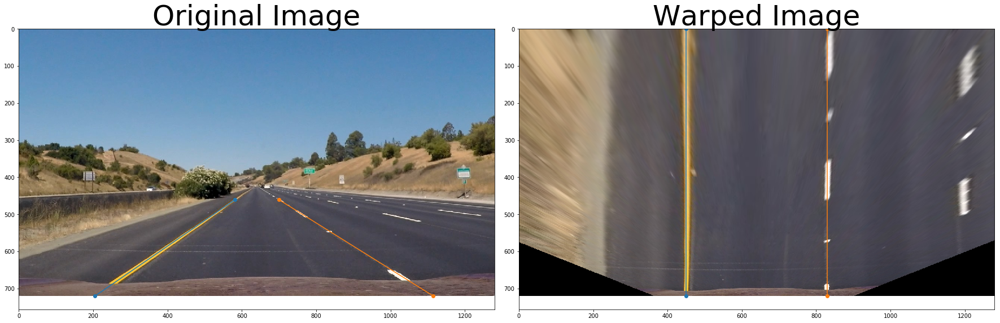

In [61]:
# load the test images
img = mpimg.imread("test_images/straight_lines1.jpg")

# create source points
imshape = img.shape
print(imshape)
offset_x_bot = 205
offset_x_top = 58
offset_y = 100
offset_dest_x = 450
left_point_bottom = [offset_x_bot, imshape[0]]
right_point_bottom = [imshape[1] - offset_x_bot + 40, imshape[0]]
left_point_top = [imshape[1]/2 - offset_x_top, imshape[0]/2 + offset_y]
right_point_top = [imshape[1]/2 + offset_x_top + 1, imshape[0]/2 + offset_y]
source = np.float32([[left_point_top], [right_point_top], [left_point_bottom], [right_point_bottom]])
# create destination points
dest = np.float32([[offset_dest_x, 0],[imshape[1]-offset_dest_x,0],[offset_dest_x,imshape[0]],[imshape[1]-offset_dest_x, imshape[0]], ])

# calculate warped image
M = cv2.getPerspectiveTransform(source, dest)
Minv = cv2.getPerspectiveTransform(dest,source)
warped = cv2.warpPerspective(img, M, (img.shape[1],img.shape[0]))

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.plot([left_point_bottom[0], left_point_top[0]], [left_point_bottom[1], left_point_top[1]], [right_point_bottom[0], right_point_top[0]], [right_point_bottom[1], right_point_top[1]], marker = 'o')
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(warped)
ax2.plot([dest[2][0], dest[0][0]], [dest[2][1], dest[0][1]], [dest[1][0], dest[3][0]], [dest[1][1], dest[3][1]], marker = 'o')
ax2.set_title('Warped Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

f.savefig("output_images/warped.jpg")

# Warp lane line detected binaries

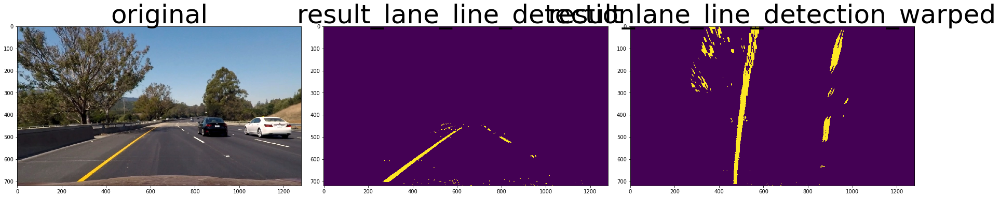

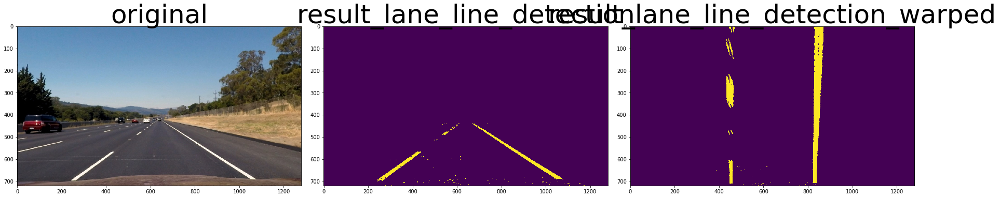

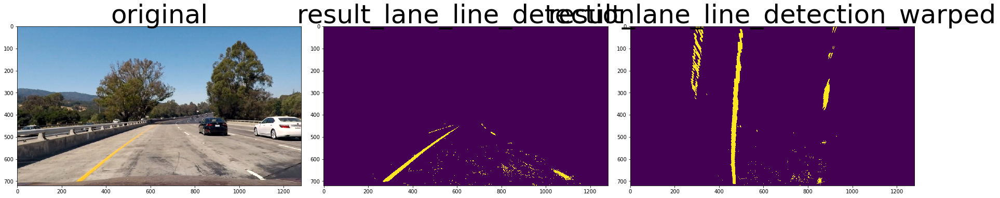

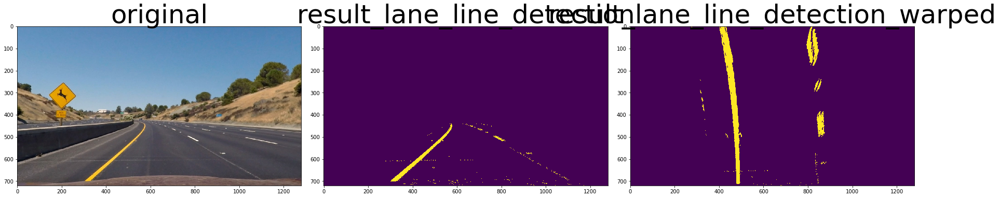

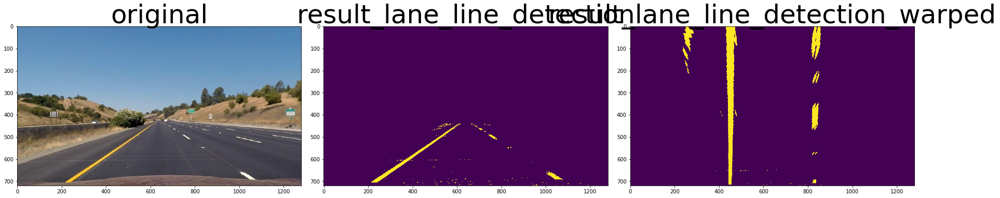

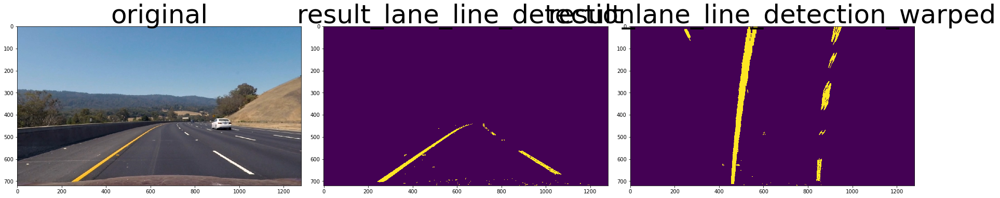

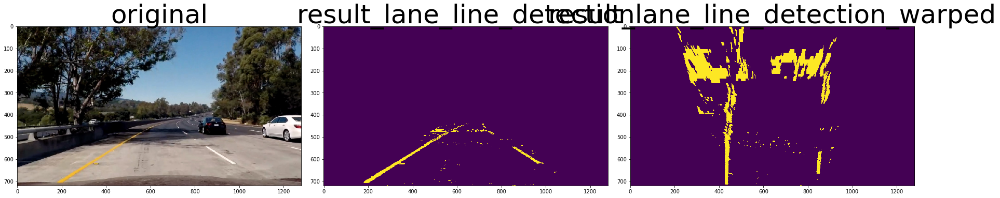

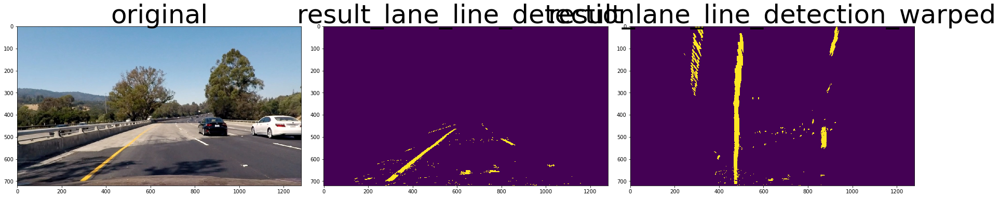

In [64]:
def detect_lane_lines(img):
    # calculate all color binaries
    s_binary = color_channel_binary(img, [140,255], cv2.COLOR_RGB2HLS, 2)
    y_binary = color_channel_binary(img, [120,255], cv2.COLOR_RGB2YUV, 0)
    u_binary = color_channel_binary(img, [0,100], cv2.COLOR_RGB2YUV, 1)
    r_binary = rgb_channel_binary(img, [170,255], 0)
    
    # calculate all gradient binaries
    mag_binary = magnitude_binary(img, 3, [30,100])
    direction_binary = gradient_direction_threshold(img, [0.7,1.3], 15)
    xgradient_binary = gradient_binary(img, 9, 'x', [50, 150])
    
    # combine binaries
    # magnitude and direction
    combined_mag_dir_binary = np.zeros_like(direction_binary)
    combined_mag_dir_binary[((direction_binary == 1) & (mag_binary == 1))] = 1
    
    # u and y channel
    combined_y_u_binary = np.zeros_like(y_binary)
    combined_y_u_binary[((y_binary == 1) & (u_binary == 1))] = 1
    
    # combine all binaries together
    combined_binary = np.zeros_like(s_binary)
    combined_binary[((combined_mag_dir_binary == 1) | (combined_y_u_binary == 1) |
                       (s_binary == 1) | (xgradient_binary == 1))] = 1
    
    return combined_binary

def generate_source_destination_points():
    # create source points
    imshape = [720,1280]
    offset_x_bot = 210
    offset_x_top = 58
    offset_y = 100
    offset_dest_x = 450
    left_point_bottom = [offset_x_bot, imshape[0]]
    right_point_bottom = [imshape[1] - offset_x_bot + 40, imshape[0]]
    left_point_top = [imshape[1]/2 - offset_x_top, imshape[0]/2 + offset_y]
    right_point_top = [imshape[1]/2 + offset_x_top + 1, imshape[0]/2 + offset_y]
    source = np.float32([[left_point_top], [right_point_top], [left_point_bottom], [right_point_bottom]])
    # create destination points
    dest = np.float32([[offset_dest_x, 0],[imshape[1]-offset_dest_x,0],[offset_dest_x,imshape[0]],[imshape[1]-offset_dest_x, imshape[0]], ])
    return source, dest

# copy from P1 for region of interest
def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    `vertices` should be a numpy array of integer points.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (1,) * channel_count
    else:
        ignore_mask_color = 1
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

def calculate_vertices(imgshape,offset_x_bot, offset_x_top, offset_y):
    left_point_bottom = (offset_x_bot, imgshape[0])
    right_point_bottom = (imgshape[1] - offset_x_bot, imgshape[0])
    left_point_top = (imgshape[1]/2 - offset_x_top, imgshape[0]/2 + offset_y)
    right_point_top = (imgshape[1]/2 + offset_x_top, imgshape[0]/2 + offset_y)
    vertices = np.array([[left_point_bottom, left_point_top, right_point_top, right_point_bottom]], dtype=np.int32)
    return vertices

images = os.listdir("test_images/")
source, dest = generate_source_destination_points()

for image_name in images:
    original_image = mpimg.imread("test_images/" + image_name)

    # undistort the image
    img_input = cv2.undistort(original_image, mtx, dist, None, mtx)
    
    result = detect_lane_lines(img_input)
    
    # apply region of interest to avoid oobjects outside our lanes
    imgshape = img.shape
    offset_x_bot = 80
    offset_x_top = 100
    offset_y = 80
    vertices = calculate_vertices(imgshape, offset_x_bot, offset_x_top, offset_y)
    masked_result = region_of_interest(result, vertices)
    
    # calculate warped image
    M = cv2.getPerspectiveTransform(source, dest)
    Minv = cv2.getPerspectiveTransform(dest,source)
    warped = cv2.warpPerspective(masked_result, M, (img_input.shape[1],img_input.shape[0]))
    
    rsl, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
    rsl.tight_layout()
    ax1.imshow(img_input)
    ax1.set_title('original', fontsize=50)
    ax2.imshow(masked_result)
    ax2.set_title('result_lane_line_detection', fontsize=50)
    ax3.imshow(warped)
    ax3.set_title('result_lane_line_detection_warped', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# Library for lane detection and warping of image

In [7]:
def color_channel_binary(img, threshold, color_space, channel):
    space = cv2.cvtColor(img, color_space)
    filtered_channel = space[:,:,channel]
    
    # generate threshholds
    binary = np.zeros_like(filtered_channel)
    binary[(filtered_channel > threshold[0]) & (filtered_channel <= threshold[1])] = 1
    return binary

def rgb_channel_binary(img, threshold, channel_number):
    # generate threshholds
    channel = img[:,:,channel_number]
    binary = np.zeros_like(channel)
    binary[(channel > threshold[0]) & (channel <= threshold[1])] = 1
    return binary

def gradient_direction_threshold(img, threshold, sobel_kernel):
    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= threshold[0]) & (absgraddir <= threshold[1])] = 1

    # Return the binary image
    return binary_output

def magnitude_binary(img, sobel_kernel, threshold):
    # Apply the following steps to img
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    mag = np.sqrt(sobelx**2 + sobely**2)
    scaled_mag = np.uint8(255 * mag/np.max(mag))
    binary_output = np.zeros_like(mag)
    binary_output[(scaled_mag >= threshold[0]) & (scaled_mag <= threshold[1])] = 1
    return binary_output

def gradient_binary(img, sobel_kernel, direction, threshold):
    # switch to gray scale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # calculate sobel in x direction
    if direction == 'x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    elif direction == 'y':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    else:
        print('wrong value')
        
    abs_sobelx = np.absolute(sobel)
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    gradient_binary = np.zeros_like(scaled_sobel)
    gradient_binary[(scaled_sobel > threshold[0]) & (scaled_sobel <= threshold[1])] = 1
    
    return gradient_binary

def detect_lane_lines(img):
    # calculate all color binaries
    s_binary = color_channel_binary(img, [140,255], cv2.COLOR_RGB2HLS, 2)
    y_binary = color_channel_binary(img, [120,255], cv2.COLOR_RGB2YUV, 0)
    u_binary = color_channel_binary(img, [0,100], cv2.COLOR_RGB2YUV, 1)
    r_binary = rgb_channel_binary(img, [170,255], 0)
    
    # calculate all gradient binaries
    mag_binary = magnitude_binary(img, 3, [30,100])
    direction_binary = gradient_direction_threshold(img, [0.7,1.3], 15)
    xgradient_binary = gradient_binary(img, 9, 'x', [50, 150])
    
    # combine binaries
    # magnitude and direction
    combined_mag_dir_binary = np.zeros_like(direction_binary)
    combined_mag_dir_binary[((direction_binary == 1) & (mag_binary == 1))] = 1
    
    # u and y channel
    combined_y_u_binary = np.zeros_like(y_binary)
    combined_y_u_binary[((y_binary == 1) & (u_binary == 1))] = 1
    
    # combine all binaries together
    combined_binary = np.zeros_like(s_binary)
    combined_binary[((combined_mag_dir_binary == 1) | (combined_y_u_binary == 1) |
                       (s_binary == 1) | (xgradient_binary == 1))] = 1
    
    return combined_binary

def generate_source_destination_points():
    # create source points
    imshape = [720,1280]
    offset_x_bot = 205
    offset_x_top = 58
    offset_y = 100
    offset_dest_x = 450
    left_point_bottom = [offset_x_bot, imshape[0]]
    right_point_bottom = [imshape[1] - offset_x_bot + 40, imshape[0]]
    left_point_top = [imshape[1]/2 - offset_x_top, imshape[0]/2 + offset_y]
    right_point_top = [imshape[1]/2 + offset_x_top + 1, imshape[0]/2 + offset_y]
    source = np.float32([[left_point_top], [right_point_top], [left_point_bottom], [right_point_bottom]])
    # create destination points
    dest = np.float32([[offset_dest_x, 0],[imshape[1]-offset_dest_x,0],[offset_dest_x,imshape[0]],[imshape[1]-offset_dest_x, imshape[0]], ])
    return source, dest

# copy from P1 for region of interest
def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    `vertices` should be a numpy array of integer points.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (1,) * channel_count
    else:
        ignore_mask_color = 1
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

def calculate_vertices(imgshape,offset_x_bot, offset_x_top, offset_y):
    left_point_bottom = (offset_x_bot, imgshape[0])
    right_point_bottom = (imgshape[1] - offset_x_bot, imgshape[0])
    left_point_top = (imgshape[1]/2 - offset_x_top, imgshape[0]/2 + offset_y)
    right_point_top = (imgshape[1]/2 + offset_x_top, imgshape[0]/2 + offset_y)
    vertices = np.array([[left_point_bottom, left_point_top, right_point_top, right_point_bottom]], dtype=np.int32)
    return vertices

def calculate_warped_lane_image(original_image, mtx, dist, source, dest):
    # undistort the image
    img_input = cv2.undistort(original_image, mtx, dist, None, mtx)
    
    result = detect_lane_lines(img_input)
    
    # apply region of interest to avoid oobjects outside our lanes
    imgshape = img_input.shape
    offset_x_bot = 80
    offset_x_top = 100
    offset_y = 80
    vertices = calculate_vertices(imgshape, offset_x_bot, offset_x_top, offset_y)
    masked_result = region_of_interest(result, vertices)
    
    # calculate warped image
    M = cv2.getPerspectiveTransform(source, dest)
    Minv = cv2.getPerspectiveTransform(dest,source)
    warped = cv2.warpPerspective(masked_result, M, (img_input.shape[1],img_input.shape[0]))
    return warped
    

# Fit lines in warped image

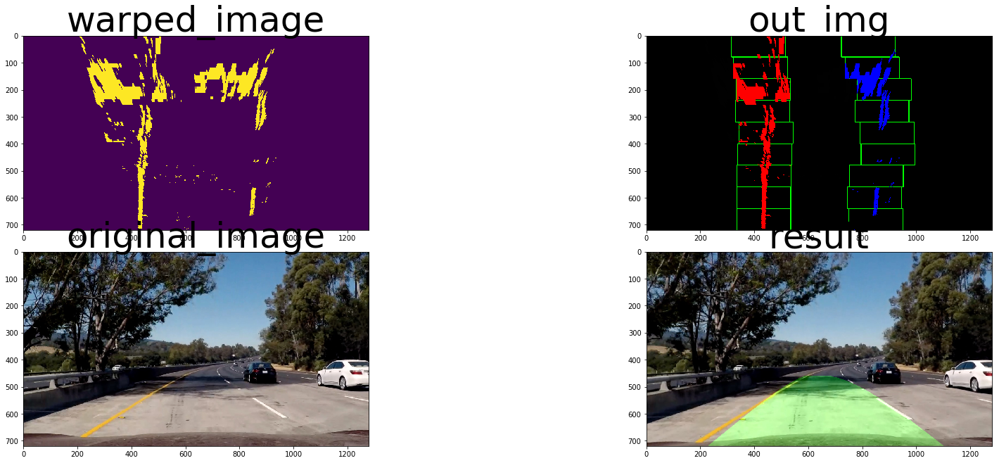

In [66]:
def find_lane_pixels(binary_warped):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        ### TO-DO: Find the four below boundaries of the window ###
        win_xleft_low = leftx_current - margin  # Update this
        win_xleft_high = leftx_current + margin  # Update this
        win_xright_low = rightx_current - margin  # Update this
        win_xright_high = rightx_current + margin  # Update this
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2) 
        
        ### TO-DO: Identify the nonzero pixels in x and y within the window ###
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        ### TO-DO: If you found > minpix pixels, recenter next window ###
        ### (`right` or `leftx_current`) on their mean position ###
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img

def fit_polynomial(binary_warped):
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)
    
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    # Plots the left and right polynomials on the lane lines
    #plt.plot(left_fitx, ploty, color='yellow')
    #plt.plot(right_fitx, ploty, color='yellow')

    return out_img, left_fitx, right_fitx, ploty

def plot_result(img, warped, right_fitx, left_fitx, ploty, source, dest):
    # plot results back to original image
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    Minv = cv2.getPerspectiveTransform(dest, source)
    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (img.shape[1], img.shape[0])) 

    # Combine the result with the original image
    result = cv2.addWeighted(img, 1, newwarp, 0.3, 0)
    return result

# load the test images
original_image = mpimg.imread("test_images/test5.jpg")

source, dest = generate_source_destination_points()

warped_image = calculate_warped_lane_image(original_image, mtx, dist, source, dest)

out_img, left_fitx, right_fitx, ploty = fit_polynomial(warped_image)

undistorted_image = cv2.undistort(original_image, mtx, dist, None, mtx)

result = plot_result(undistorted_image, warped_image, right_fitx, left_fitx, ploty, source, dest)

rsl, [(ax1, ax2), (ax3, ax4)] = plt.subplots(2, 2, figsize=(24, 9))
rsl.tight_layout()
ax1.imshow(warped_image)
ax1.set_title('warped_image', fontsize=50)
ax2.imshow(out_img)
ax2.set_title('out_img', fontsize=50)
ax3.imshow(original_image)
ax3.set_title('original_image', fontsize=50)
ax4.imshow(result)
ax4.set_title('result', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

f.savefig("output_images/slidingwindow.jpg")

In [5]:
def color_channel_binary(img, threshold, color_space, channel):
    space = cv2.cvtColor(img, color_space)
    filtered_channel = space[:,:,channel]
    
    # generate threshholds
    binary = np.zeros_like(filtered_channel)
    binary[(filtered_channel > threshold[0]) & (filtered_channel <= threshold[1])] = 1
    return binary

def rgb_channel_binary(img, threshold, channel_number):
    # generate threshholds
    channel = img[:,:,channel_number]
    binary = np.zeros_like(channel)
    binary[(channel > threshold[0]) & (channel <= threshold[1])] = 1
    return binary

def gradient_direction_threshold(img, threshold, sobel_kernel):
    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= threshold[0]) & (absgraddir <= threshold[1])] = 1

    # Return the binary image
    return binary_output

def magnitude_binary(img, sobel_kernel, threshold):
    # Apply the following steps to img
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    mag = np.sqrt(sobelx**2 + sobely**2)
    scaled_mag = np.uint8(255 * mag/np.max(mag))
    binary_output = np.zeros_like(mag)
    binary_output[(scaled_mag >= threshold[0]) & (scaled_mag <= threshold[1])] = 1
    return binary_output

def gradient_binary(img, sobel_kernel, direction, threshold):
    # switch to gray scale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # calculate sobel in x direction
    if direction == 'x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    elif direction == 'y':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    else:
        print('wrong value')
        
    abs_sobelx = np.absolute(sobel)
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    gradient_binary = np.zeros_like(scaled_sobel)
    gradient_binary[(scaled_sobel > threshold[0]) & (scaled_sobel <= threshold[1])] = 1
    
    return gradient_binary

def detect_lane_lines(img):
    # calculate all color binaries
    s_binary = color_channel_binary(img, [140,255], cv2.COLOR_RGB2HLS, 2)
    y_binary = color_channel_binary(img, [120,255], cv2.COLOR_RGB2YUV, 0)
    u_binary = color_channel_binary(img, [0,100], cv2.COLOR_RGB2YUV, 1)
    r_binary = rgb_channel_binary(img, [170,255], 0)
    
    # calculate all gradient binaries
    mag_binary = magnitude_binary(img, 3, [30,100])
    direction_binary = gradient_direction_threshold(img, [0.7,1.3], 15)
    xgradient_binary = gradient_binary(img, 9, 'x', [50, 150])
    
    # combine binaries
    # magnitude and direction
    combined_mag_dir_binary = np.zeros_like(direction_binary)
    combined_mag_dir_binary[((direction_binary == 1) & (mag_binary == 1))] = 1
    
    # u and y channel
    combined_y_u_binary = np.zeros_like(y_binary)
    combined_y_u_binary[((y_binary == 1) & (u_binary == 1))] = 1
    
    # combine all binaries together
    combined_binary = np.zeros_like(s_binary)
    combined_binary[((combined_y_u_binary == 1) |
                       (s_binary == 1) | (xgradient_binary == 1))] = 1
    
    return combined_binary

def generate_source_destination_points():
    # create source points
    imshape = [720,1280]
    offset_x_bot = 205
    offset_x_top = 58
    offset_y = 100
    offset_dest_x = 450
    left_point_bottom = [offset_x_bot, imshape[0]]
    right_point_bottom = [imshape[1] - offset_x_bot + 40, imshape[0]]
    left_point_top = [imshape[1]/2 - offset_x_top, imshape[0]/2 + offset_y]
    right_point_top = [imshape[1]/2 + offset_x_top + 1, imshape[0]/2 + offset_y]
    source = np.float32([[left_point_top], [right_point_top], [left_point_bottom], [right_point_bottom]])
    # create destination points
    dest = np.float32([[offset_dest_x, 0],[imshape[1]-offset_dest_x,0],[offset_dest_x,imshape[0]],[imshape[1]-offset_dest_x, imshape[0]], ])
    return source, dest

# copy from P1 for region of interest
def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    `vertices` should be a numpy array of integer points.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (1,) * channel_count
    else:
        ignore_mask_color = 1
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

def calculate_vertices(imgshape,offset_x_bot, offset_x_top, offset_y):
    left_point_bottom = (offset_x_bot, imgshape[0])
    right_point_bottom = (imgshape[1] - offset_x_bot, imgshape[0])
    left_point_top = (imgshape[1]/2 - offset_x_top, imgshape[0]/2 + offset_y)
    right_point_top = (imgshape[1]/2 + offset_x_top, imgshape[0]/2 + offset_y)
    vertices = np.array([[left_point_bottom, left_point_top, right_point_top, right_point_bottom]], dtype=np.int32)
    return vertices

def calculate_warped_lane_image(original_image, mtx, dist, source, dest):
    # undistort the image
    img_input = cv2.undistort(original_image, mtx, dist, None, mtx)
    
    result = detect_lane_lines(img_input)
    
    # apply region of interest to avoid oobjects outside our lanes
    imgshape = img_input.shape
    offset_x_bot = 80
    offset_x_top = 100
    offset_y = 80
    vertices = calculate_vertices(imgshape, offset_x_bot, offset_x_top, offset_y)
    masked_result = region_of_interest(result, vertices)
    
    # calculate warped image
    M = cv2.getPerspectiveTransform(source, dest)
    Minv = cv2.getPerspectiveTransform(dest,source)
    warped = cv2.warpPerspective(masked_result, M, (img_input.shape[1],img_input.shape[0]))
    return warped
    

def find_lane_pixels(binary_warped):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        ### TO-DO: Find the four below boundaries of the window ###
        win_xleft_low = leftx_current - margin  # Update this
        win_xleft_high = leftx_current + margin  # Update this
        win_xright_low = rightx_current - margin  # Update this
        win_xright_high = rightx_current + margin  # Update this
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2) 
        
        ### TO-DO: Identify the nonzero pixels in x and y within the window ###
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        ### TO-DO: If you found > minpix pixels, recenter next window ###
        ### (`right` or `leftx_current`) on their mean position ###
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img

def fit_polynomial(binary_warped):
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)
    
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    # Plots the left and right polynomials on the lane lines
    #plt.plot(left_fitx, ploty, color='yellow')
    #plt.plot(right_fitx, ploty, color='yellow')

    return out_img, left_fitx, right_fitx, ploty

def plot_result(img, warped, right_fitx, left_fitx, ploty, source, dest):
    # plot results back to original image
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    Minv = cv2.getPerspectiveTransform(dest, source)
    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (img.shape[1], img.shape[0])) 

    # Combine the result with the original image
    result = cv2.addWeighted(img, 1, newwarp, 0.3, 0)
    return result

def process_image(original_image):
    source, dest = generate_source_destination_points()

    warped_image = calculate_warped_lane_image(original_image, mtx, dist, source, dest)

    out_img, left_fitx, right_fitx, ploty = fit_polynomial(warped_image)

    undistorted_image = cv2.undistort(original_image, mtx, dist, None, mtx)

    result = plot_result(undistorted_image, warped_image, right_fitx, left_fitx, ploty, source, dest)
    
    return result


# process video images

In [6]:
white_output = 'project_video_output.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip1 = VideoFileClip("project_video.mp4").subclip(18,26)

white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


100%|█████████▉| 200/201 [01:47<00:00,  1.77it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

CPU times: user 1min 20s, sys: 6.65 s, total: 1min 27s
Wall time: 1min 50s


Results have some problems if we enter two tricky situations (18 to 26 secs). Try to add line class so we can filter if new result is close to old one.

# Final Pipeline Library

In [67]:
def color_channel_binary(img, threshold, color_space, channel):
    space = cv2.cvtColor(img, color_space)
    filtered_channel = space[:,:,channel]
    
    # generate threshholds
    binary = np.zeros_like(filtered_channel)
    binary[(filtered_channel > threshold[0]) & (filtered_channel <= threshold[1])] = 1
    return binary

def rgb_channel_binary(img, threshold, channel_number):
    # generate threshholds
    channel = img[:,:,channel_number]
    binary = np.zeros_like(channel)
    binary[(channel > threshold[0]) & (channel <= threshold[1])] = 1
    return binary

def gradient_direction_threshold(img, threshold, sobel_kernel):
    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= threshold[0]) & (absgraddir <= threshold[1])] = 1

    # Return the binary image
    return binary_output

def magnitude_binary(img, sobel_kernel, threshold):
    # Apply the following steps to img
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    mag = np.sqrt(sobelx**2 + sobely**2)
    scaled_mag = np.uint8(255 * mag/np.max(mag))
    binary_output = np.zeros_like(mag)
    binary_output[(scaled_mag >= threshold[0]) & (scaled_mag <= threshold[1])] = 1
    return binary_output

def gradient_binary(img, sobel_kernel, direction, threshold):
    # switch to gray scale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # calculate sobel in x direction
    if direction == 'x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    elif direction == 'y':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    else:
        print('wrong value')
        
    abs_sobelx = np.absolute(sobel)
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    gradient_binary = np.zeros_like(scaled_sobel)
    gradient_binary[(scaled_sobel > threshold[0]) & (scaled_sobel <= threshold[1])] = 1
    
    return gradient_binary

def detect_lane_lines(img):
    # calculate all color binaries
    l_binary = color_channel_binary(img, [200,255], cv2.COLOR_RGB2HLS,1)
    s_binary = color_channel_binary(img, [140,255], cv2.COLOR_RGB2HLS, 2)
    y_binary = color_channel_binary(img, [120,255], cv2.COLOR_RGB2YUV, 0)
    u_binary = color_channel_binary(img, [0,100], cv2.COLOR_RGB2YUV, 1)
    r_binary = rgb_channel_binary(img, [170,255], 0)
    b_binary = color_channel_binary(img, [150,255], cv2.COLOR_RGB2LAB, 2)
    
    
    # calculate all gradient binaries
    mag_binary = magnitude_binary(img, 3, [30,100])
    direction_binary = gradient_direction_threshold(img, [0.7,1.3], 15)
    xgradient_binary = gradient_binary(img, 9, 'x', [50, 150])
    
    # combine binaries
    # magnitude and direction
    combined_mag_dir_binary = np.zeros_like(direction_binary)
    combined_mag_dir_binary[((direction_binary == 1) & (mag_binary == 1))] = 1
    
    # u and y channel
    combined_y_u_binary = np.zeros_like(y_binary)
    combined_y_u_binary[((y_binary == 1) & (u_binary == 1))] = 1
    
    # combine all binaries together
    #combined_binary = np.zeros_like(s_binary)
    #combined_binary[((combined_y_u_binary == 1) |
    #                   (s_binary == 1) | (xgradient_binary == 1))] = 1
    
    combined_binary = np.zeros_like(l_binary)
    combined_binary[((l_binary == 1) | (b_binary == 1))] = 1
    
    return combined_binary

def generate_source_destination_points():
    # create source points
    imshape = [720,1280]
    offset_x_bot = 205
    offset_x_top = 58
    offset_y = 100
    offset_dest_x = 450
    left_point_bottom = [offset_x_bot, imshape[0]]
    right_point_bottom = [imshape[1] - offset_x_bot + 40, imshape[0]]
    left_point_top = [imshape[1]/2 - offset_x_top, imshape[0]/2 + offset_y]
    right_point_top = [imshape[1]/2 + offset_x_top + 1, imshape[0]/2 + offset_y]
    source = np.float32([[left_point_top], [right_point_top], [left_point_bottom], [right_point_bottom]])
    # create destination points
    dest = np.float32([[offset_dest_x, 0],[imshape[1]-offset_dest_x,0],[offset_dest_x,imshape[0]],[imshape[1]-offset_dest_x, imshape[0]], ])
    return source, dest

# copy from P1 for region of interest
def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    `vertices` should be a numpy array of integer points.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (1,) * channel_count
    else:
        ignore_mask_color = 1
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

def calculate_vertices(imgshape,offset_x_bot, offset_x_top, offset_y):
    left_point_bottom = (offset_x_bot, imgshape[0])
    right_point_bottom = (imgshape[1] - offset_x_bot, imgshape[0])
    left_point_top = (imgshape[1]/2 - offset_x_top, imgshape[0]/2 + offset_y)
    right_point_top = (imgshape[1]/2 + offset_x_top, imgshape[0]/2 + offset_y)
    vertices = np.array([[left_point_bottom, left_point_top, right_point_top, right_point_bottom]], dtype=np.int32)
    return vertices

def calculate_warped_lane_image(original_image, mtx, dist, source, dest):
    # undistort the image
    img_input = cv2.undistort(original_image, mtx, dist, None, mtx)
    
    result = detect_lane_lines(img_input)
    
    # apply region of interest to avoid oobjects outside our lanes
    imgshape = img_input.shape
    offset_x_bot = 80
    offset_x_top = 100
    offset_y = 80
    vertices = calculate_vertices(imgshape, offset_x_bot, offset_x_top, offset_y)
    masked_result = region_of_interest(result, vertices)
    
    # calculate warped image
    M = cv2.getPerspectiveTransform(source, dest)
    Minv = cv2.getPerspectiveTransform(dest,source)
    warped = cv2.warpPerspective(masked_result, M, (img_input.shape[1],img_input.shape[0]))
    return warped
    

def find_lane_pixels(binary_warped):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        ### TO-DO: Find the four below boundaries of the window ###
        win_xleft_low = leftx_current - margin  # Update this
        win_xleft_high = leftx_current + margin  # Update this
        win_xright_low = rightx_current - margin  # Update this
        win_xright_high = rightx_current + margin  # Update this
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2) 
        
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # recenter window if > minpix
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img

def fit_polynomial(binary_warped):
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)
    
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty
        
    # Calculate position of car
    car_center = binary_warped.shape[1]/2
    y_bottom = binary_warped.shape[0]
    
    left_fit_bottom = left_fit[0]*y_bottom**2 + left_fit[1]*y_bottom + left_fit[2]
    right_fit_bottom = right_fit[0]*y_bottom**2 + right_fit[1]*y_bottom + right_fit[2]
    
    center_diff = (car_center - ((right_fit_bottom + left_fit_bottom)/2))
    
    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    # Plots the left and right polynomials on the lane lines
    #plt.plot(left_fitx, ploty, color='yellow')
    #plt.plot(right_fitx, ploty, color='yellow')

    return out_img, leftx, lefty, rightx, righty, left_fitx, right_fitx, ploty, center_diff

def plot_result(img, warped, right_fitx, left_fitx, ploty, source, dest):
    # plot results back to original image
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    Minv = cv2.getPerspectiveTransform(dest, source)
    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (img.shape[1], img.shape[0])) 

    # Combine the result with the original image
    result = cv2.addWeighted(img, 1, newwarp, 0.3, 0)
    return result

def measure_curvature_pixels(ploty, left_fit, right_fit, xm_per_pix, ym_per_pix, leftx, lefty, rightx, righty):
    '''
    Calculates the curvature of polynomial functions in pixels.
    '''
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    
    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    return left_curverad, right_curverad

def process_image(original_image):
    source, dest = generate_source_destination_points()

    warped_image = calculate_warped_lane_image(original_image, mtx, dist, source, dest)

    out_img, leftx, lefty, rightx, righty, left_fitx, right_fitx, ploty, center_diff = fit_polynomial(warped_image)

    undistorted_image = cv2.undistort(original_image, mtx, dist, None, mtx)
    
    xm_per_pix = 3.7/380
    ym_per_pix = 30/720
    cl, cr = measure_curvature_pixels(ploty, left_fitx, right_fitx, xm_per_pix, ym_per_pix, leftx, lefty, rightx, righty)
    center_diff_m = center_diff * xm_per_pix
    result = plot_result(undistorted_image, warped_image, right_fitx, left_fitx, ploty, source, dest)
    
    # add additional information to image
    font = cv2.FONT_HERSHEY_SIMPLEX
    result = cv2.putText(result,'%.3f' % cl, (5, 50), font, 1,(255,255,255),2,cv2.LINE_AA)
    result = cv2.putText(result,'%.3f' % cr, (1000, 50), font, 1,(255,255,255),2,cv2.LINE_AA)
    result = cv2.putText(result,'center_offset = %.3f' % center_diff_m, (500, 50), font, 1,(255,255,255),2,cv2.LINE_AA)
    return result

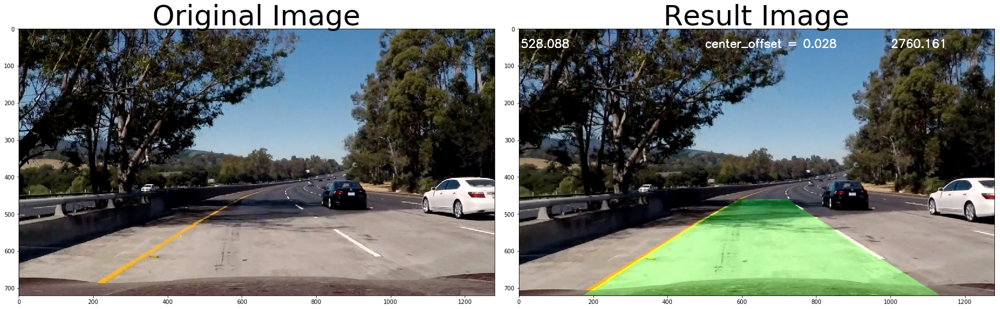

In [69]:
# load the test images
original_image = mpimg.imread("test_images/test5.jpg")
result = process_image(original_image)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(original_image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(result)
ax2.set_title('Result Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

f.savefig("output_images/result_image.jpg")

In [41]:
white_output = 'project_video_output.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip1 = VideoFileClip("project_video.mp4")

white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4



 24%|██▍       | 303/1261 [02:49<09:08,  1.75it/s]


 48%|████▊     | 605/1261 [05:43<07:05,  1.54it/s]


 72%|███████▏  | 907/1261 [08:33<03:30,  1.69it/s]


 96%|█████████▌| 1205/1261 [11:24<00:31,  1.76it/s]


100%|█████████▉| 1260/1261 [11:56<00:00,  1.82it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

CPU times: user 8min 52s, sys: 47.6 s, total: 9min 40s
Wall time: 11min 59s
